In [1]:
# !curl -O https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
# !curl -O https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
# !tar -xf images.tar.gz
# !tar -xf annotations.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  755M  100  755M    0     0  4176k      0  0:03:05  0:03:05 --:--:-- 5930k  755M    7 53.7M    0     0  2515k      0  0:05:07  0:00:21  0:04:46 3111k17  135M    0     0  2901k      0  0:04:26  0:00:47  0:03:39 3892kM   24  181M    0     0  3212k      0  0:04:00  0:00:57  0:03:03 4209k 39  301M    0     0  3722k      0  0:03:27  0:01:22  0:02:05 4486k34k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.2M  100 18.2M    0     0  1997k      0  0:00:09  0:00:09 --:--:-- 2318k


In [1]:
import os

input_dir = "images/"
target_dir = "annotations/trimaps/"
img_size = (160, 160)
num_classes = 3
batch_size = 32

input_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if fname.endswith(".jpg")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(target_dir, fname)
        for fname in os.listdir(target_dir)
        if fname.endswith(".png") and not fname.startswith(".")
    ]
)

print("Number of samples:", len(input_img_paths))

for input_path, target_path in zip(input_img_paths[:10], target_img_paths[:10]):
    print(input_path, "|", target_path)

Number of samples: 7390
images/Abyssinian_1.jpg | annotations/trimaps/Abyssinian_1.png
images/Abyssinian_10.jpg | annotations/trimaps/Abyssinian_10.png
images/Abyssinian_100.jpg | annotations/trimaps/Abyssinian_100.png
images/Abyssinian_101.jpg | annotations/trimaps/Abyssinian_101.png
images/Abyssinian_102.jpg | annotations/trimaps/Abyssinian_102.png
images/Abyssinian_103.jpg | annotations/trimaps/Abyssinian_103.png
images/Abyssinian_104.jpg | annotations/trimaps/Abyssinian_104.png
images/Abyssinian_105.jpg | annotations/trimaps/Abyssinian_105.png
images/Abyssinian_106.jpg | annotations/trimaps/Abyssinian_106.png
images/Abyssinian_107.jpg | annotations/trimaps/Abyssinian_107.png


INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2


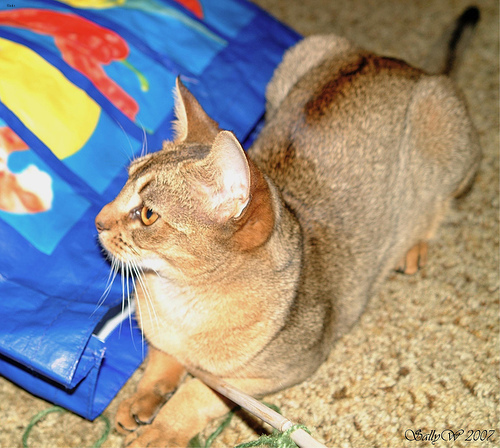

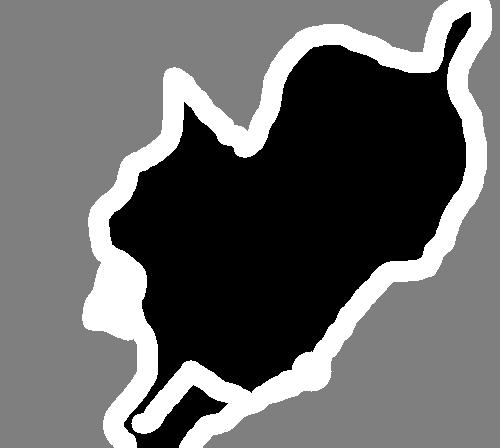

In [2]:
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import PIL
from PIL import ImageOps

import matplotlib.pyplot as plt
import numpy as np

# Display input image #7
display(Image(filename=input_img_paths[9]))

# Display auto-contrast version of corresponding target (per-pixel categories)
img = PIL.ImageOps.autocontrast(load_img(target_img_paths[9]))
display(img)

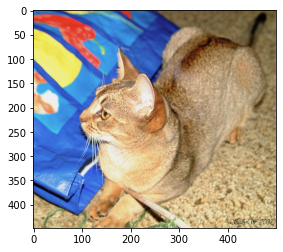

In [3]:
# load_img(input_img_paths[9])
# load_img(target_img_paths[9])

plt.imshow(img_to_array(load_img(input_img_paths[9]))/255.0)

In [4]:
np.histogram(img_to_array(load_img(input_img_paths[9])))

(array([ 8554, 32061, 65113, 66933, 97290, 96140, 93322, 78318, 79552,
        54717]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ], dtype=float32))

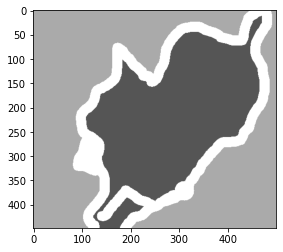

In [5]:
plt.imshow(img_to_array(load_img(target_img_paths[9]))/3.0)

In [6]:
np.histogram(img_to_array(load_img(target_img_paths[9])))

(array([230727,      0,      0,      0,      0, 331098,      0,      0,
             0, 110175]),
 array([1. , 1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4, 2.6, 2.8, 3. ],
       dtype=float32))

In [7]:
from tensorflow import keras
import numpy as np
from tensorflow.keras.preprocessing.image import load_img


class OxfordPets(keras.utils.Sequence):
    """Helper to iterate over the data (as Numpy arrays)."""

    def __init__(self, batch_size, img_size, input_img_paths, target_img_paths):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths) // self.batch_size

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        i = idx * self.batch_size
        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_target_img_paths = self.target_img_paths[i : i + self.batch_size]
        x = np.zeros((self.batch_size,) + self.img_size + (3,), dtype="float32")
        for j, path in enumerate(batch_input_img_paths):
            img = load_img(path, target_size=self.img_size)
            x[j] = img
        y = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_target_img_paths):
            img = load_img(path, target_size=self.img_size, color_mode="grayscale")
            y[j] = np.expand_dims(img, 2)
            # Ground truth labels are 1, 2, 3. Subtract one to make them 0, 1, 2:
            y[j] -= 1
        return x, y


In [8]:
from tensorflow.keras import layers


def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model


# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model(img_size, num_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 80, 80, 32)   896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 80, 80, 32)   128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 80, 80, 32)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [9]:
import random

# Split our img paths into a training and a validation set
val_samples = 1000
random.Random(1337).shuffle(input_img_paths)
random.Random(1337).shuffle(target_img_paths)
train_input_img_paths = input_img_paths[:-val_samples]
train_target_img_paths = target_img_paths[:-val_samples]
val_input_img_paths = input_img_paths[-val_samples:]
val_target_img_paths = target_img_paths[-val_samples:]

# Instantiate data Sequences for each split
train_gen = OxfordPets(
    batch_size, img_size, train_input_img_paths, train_target_img_paths
)
val_gen = OxfordPets(batch_size, img_size, val_input_img_paths, val_target_img_paths)

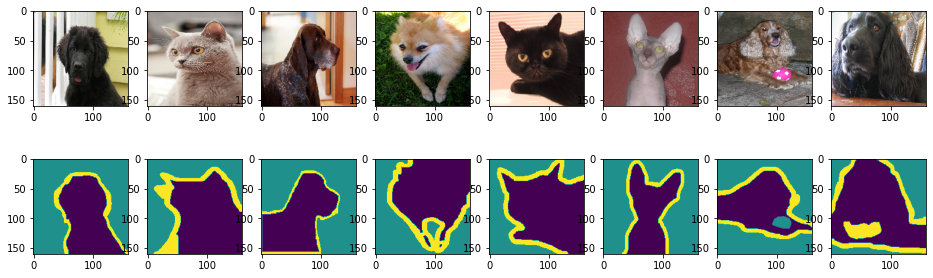

In [14]:
fig, axes = plt.subplots(2, 8, figsize=(16, 5))
# fig.subplots_adjust(hspace=0.1)

for a in np.arange(0,8):
    
    image = train_gen[5][0][a+5,:,:,:]/255

    # Load masks
    mask = train_gen[5][1][a+5,:,:,:]
    axes[0, a].imshow( image)
    axes[1, a].imshow( mask)

In [16]:
np.histogram(train_gen[5][0][a+5,:,:,:])

(array([ 9410, 24551, 11112,  6038,  4765,  4200,  4264,  3573,  2651,
         6236]),
 array([  4. ,  29.1,  54.2,  79.3, 104.4, 129.5, 154.6, 179.7, 204.8,
        229.9, 255. ], dtype=float32))

In [17]:
np.histogram(train_gen[5][1][a+5,:,:,:])

(array([14862,     0,     0,     0,     0,  5806,     0,     0,     0,
         4932]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]))

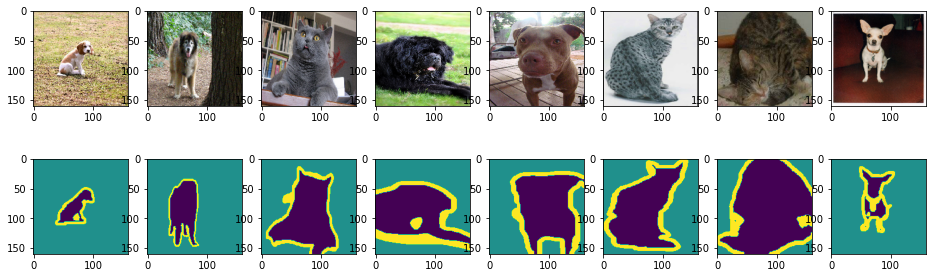

In [18]:
fig, axes = plt.subplots(2, 8, figsize=(16, 5))
# fig.subplots_adjust(hspace=0.1)

for a in np.arange(0,8):
    
    image = val_gen[5][0][a+5,:,:,:]/255

    # Load masks
    mask = val_gen[5][1][a+5,:,:,:]
    axes[0, a].imshow( image)
    axes[1, a].imshow( mask)

In [19]:
np.histogram(val_gen[5][0][a+5,:,:,:])

(array([31796, 17824,  5038,  4118,  2515,  1486,  1865,  2648,  1844,
         7666]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ], dtype=float32))

In [20]:
np.histogram(val_gen[5][1][a+5,:,:,:])

(array([ 1545,     0,     0,     0,     0, 21455,     0,     0,     0,
         2600]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]))

In [21]:
# Configure the model for training.
# We use the "sparse" version of categorical_crossentropy
# because our target data is integers.
model.compile(optimizer="rmsprop", loss="sparse_categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("oxford_segmentation.h5", save_best_only=True)
]

# Train the model, doing validation at the end of each epoch.
epochs = 15
model.fit(train_gen, epochs=epochs, validation_data=val_gen, callbacks=callbacks , use_multiprocessing=True)

Epoch 1/15
199/199 [==============================] - 291s 1s/step - loss: 1.8779 - val_loss: 2.4489


/home/hgamarro/anaconda3/envs/deeplearningDB/lib/python3.9/site-packages/tensorflow/python/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/15
199/199 [==============================] - 276s 1s/step - loss: 0.5339 - val_loss: 2.5415
Epoch 3/15
199/199 [==============================] - 275s 1s/step - loss: 0.4460 - val_loss: 0.4925
Epoch 4/15
199/199 [==============================] - 276s 1s/step - loss: 0.3872 - val_loss: 0.4140
Epoch 5/15
199/199 [==============================] - 276s 1s/step - loss: 0.3507 - val_loss: 0.4252
Epoch 6/15
199/199 [==============================] - 276s 1s/step - loss: 0.3190 - val_loss: 0.3730
Epoch 7/15
199/199 [==============================] - 276s 1s/step - loss: 0.2945 - val_loss: 0.3781
Epoch 8/15
199/199 [==============================] - 276s 1s/step - loss: 0.2746 - val_loss: 0.3799
Epoch 9/15
199/199 [==============================] - 277s 1s/step - loss: 0.2512 - val_loss: 0.3636
Epoch 10/15
199/199 [==============================] - 276s 1s/step - loss: 0.2338 - val_loss: 0.4161
Epoch 11/15
199/199 [==============================] - 276s 1s/step - loss: 0.2279 - val_l

In [26]:
def plot_history(history):
       
#     acc = history.history['accuracy']
#     val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss'] 
    
    plt.figure(figsize=(10, 5))
#     plt.subplot(1, 2, 1)
#     plt.plot(acc)
#     plt.plot(val_acc)
#     plt.ylabel('accuracy')
#     plt.xlabel('epoch')
#     plt.legend(['train', 'val'], loc='upper left')
    
#     plt.subplot(1, 2, 2)
    plt.plot(loss)
    plt.plot(val_loss)
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    
    plt.show();

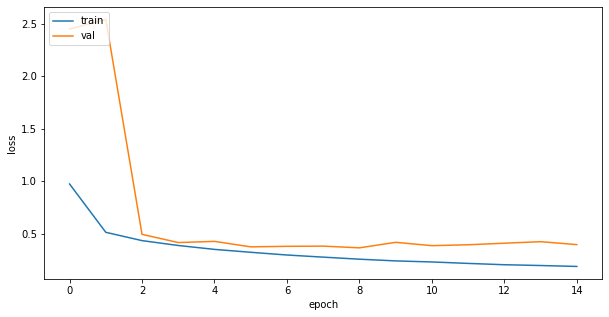

In [27]:

plot_history(model.history)

In [33]:
val_check =  model.predict(val_gen[12][0])

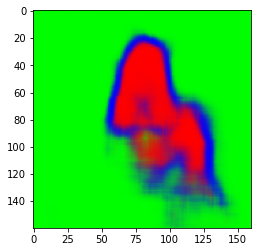

In [30]:
plt.imshow(val_check[12,:,:,:])

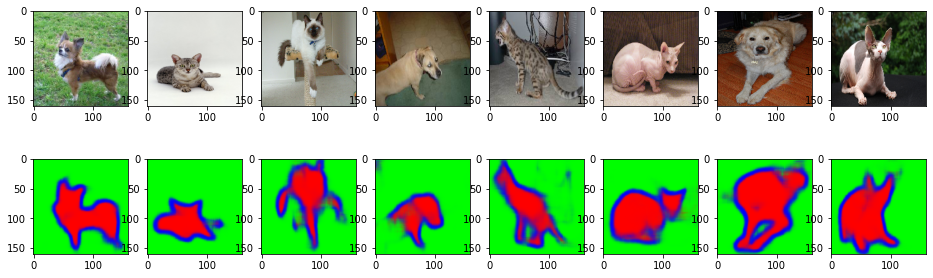

In [34]:
fig, axes = plt.subplots(2, 8, figsize=(16, 5))
# fig.subplots_adjust(hspace=0.1)

for a in np.arange(0,8):
    
    image = val_gen[12][0][a + 5 , :,:,:]/255

    # Load masks
    mask = val_check[a+5,:,:,:]
    
    
    axes[0, a].imshow( image)
    axes[1, a].imshow( mask)

In [38]:
from keras import models

#copies all layers of model
activation_layers = [layer.output for layer in model.layers]

# Creates a model that will return these outputs, given the model input
activation_model = models.Model(inputs=model.input, outputs=activation_layers)
# Returns a list of five Numpy arrays: one array per layer activation
print ("num of layers: " ,len(activation_layers))
activation_model.summary()

num of layers:  72
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Total params: 2,058,979
Trainable params: 2,055,203
Non-trainable params: 3,776
__________________________________________________________________________________________________


In [ ]:
temp = val_gen[12][0]
temp_pred = activation_model.predict(temp)

In [52]:
activation_layers

[<KerasTensor: shape=(None, 160, 160, 3) dtype=float32 (created by layer 'input_1')>,
 <KerasTensor: shape=(None, 80, 80, 32) dtype=float32 (created by layer 'conv2d')>,
 <KerasTensor: shape=(None, 80, 80, 32) dtype=float32 (created by layer 'batch_normalization')>,
 <KerasTensor: shape=(None, 80, 80, 32) dtype=float32 (created by layer 'activation')>,
 <KerasTensor: shape=(None, 80, 80, 32) dtype=float32 (created by layer 'activation_1')>,
 <KerasTensor: shape=(None, 80, 80, 64) dtype=float32 (created by layer 'separable_conv2d')>,
 <KerasTensor: shape=(None, 80, 80, 64) dtype=float32 (created by layer 'batch_normalization_1')>,
 <KerasTensor: shape=(None, 80, 80, 64) dtype=float32 (created by layer 'activation_2')>,
 <KerasTensor: shape=(None, 80, 80, 64) dtype=float32 (created by layer 'separable_conv2d_1')>,
 <KerasTensor: shape=(None, 80, 80, 64) dtype=float32 (created by layer 'batch_normalization_2')>,
 <KerasTensor: shape=(None, 40, 40, 64) dtype=float32 (created by layer 'max_

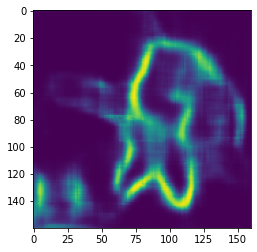

In [65]:
layer_idx = 71
channel_idx = 2
plt.imshow(temp_pred[layer_idx][0,:,:,channel_idx] )

In [ ]:
plt.imshow

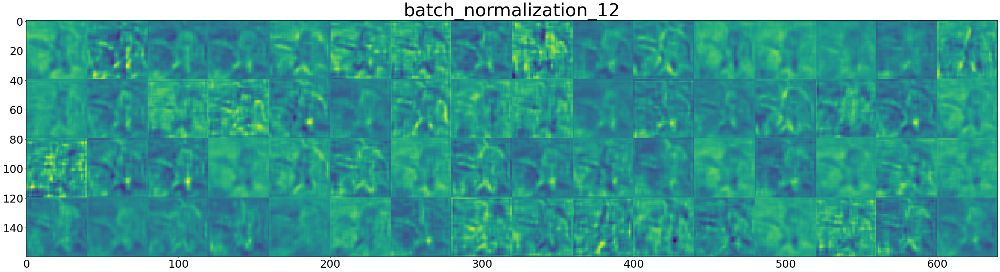

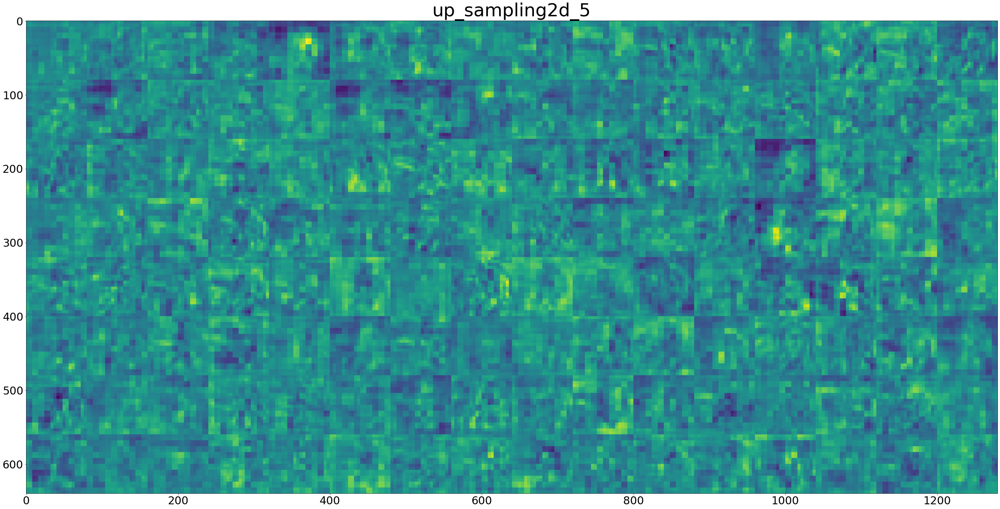

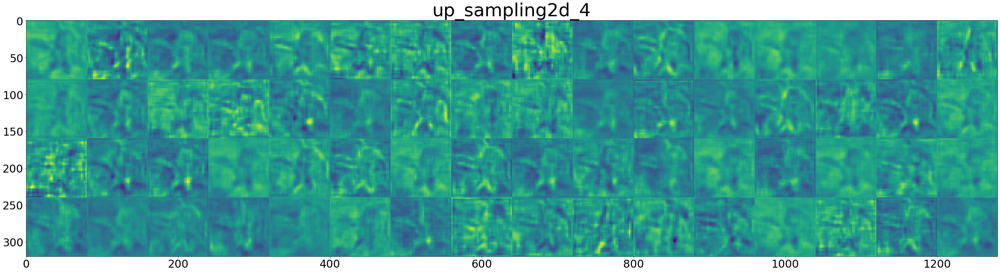

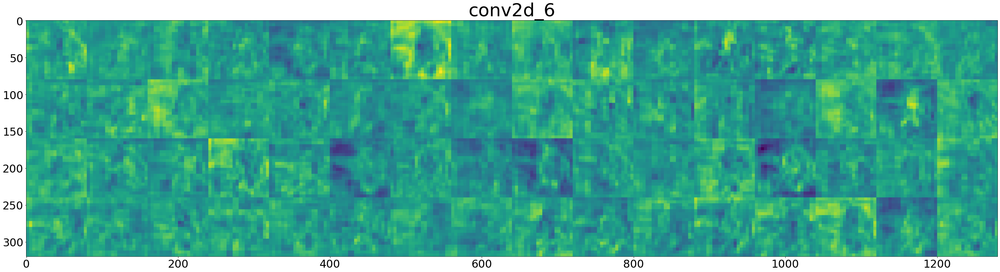

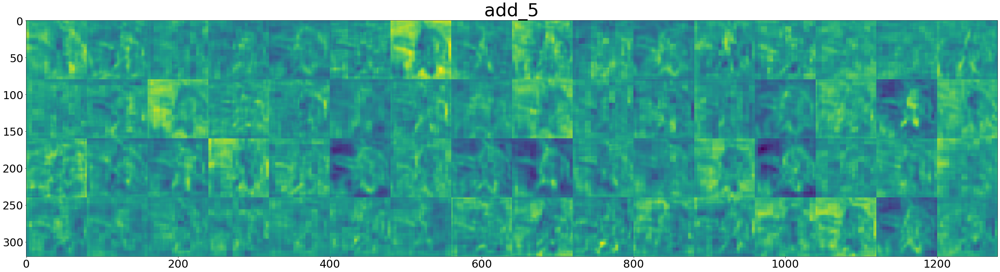

...

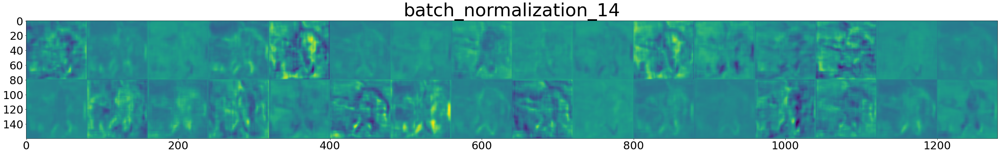

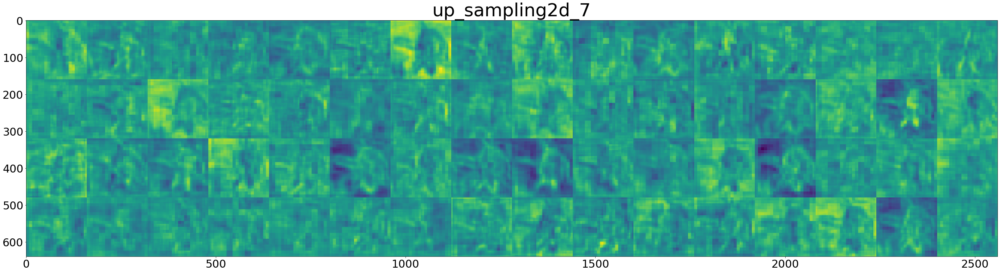

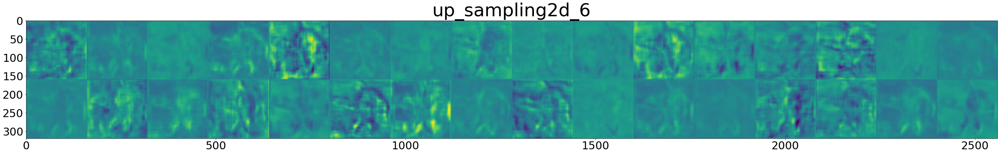

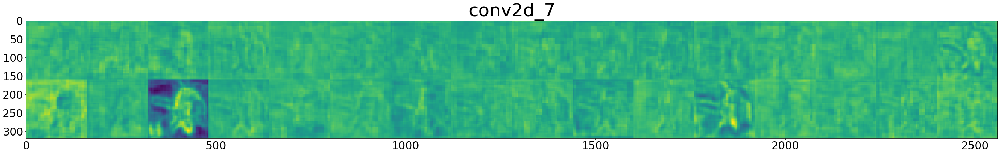

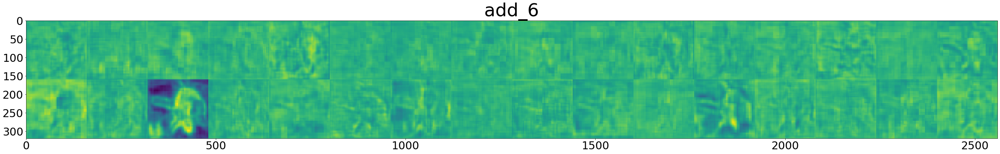

In [69]:
#warnings.filterwarnings(action="ignore" ,category=UserWarning)

# Extracts the outputs starting at x layer
x_layers = 56
x_range = 15
layer_names = []
for layer in model.layers[x_layers:x_layers+x_range]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, temp_pred[x_layers:x_layers+x_range]): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    '''print("\n1~activation_shape " ,layer_activation.shape)
    print("n_features " ,n_features)
    print("size " ,size)
    print("n_cols " ,n_cols)
    print("display_grid " ,size * n_cols ," ; " ,images_per_row * size)
    print("2~layername " ,layer_name)'''
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            '''channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            #channel_image /= channel_image.std()
            channel_image *= 3
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')'''
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 3. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name,fontsize=50)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto' #,cmap='viridis'
              )

#warnings.filterwarnings(action='default')